<a href="https://colab.research.google.com/github/fabrytp8/deepLearning/blob/main/Gatos_y_Perros.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive/')
BASE_FOLDER = '/content/drive/MyDrive/07MIAR_Proyecto_Programacion/'

Mounted at /content/drive/


In [2]:
!wget https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip

--2022-07-31 05:07:27--  https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip
Resolving download.microsoft.com (download.microsoft.com)... 23.54.48.114, 2600:1409:3800:1ab::e59, 2600:1409:3800:18d::e59
Connecting to download.microsoft.com (download.microsoft.com)|23.54.48.114|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824887076 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_5340.zip’

kagglecatsanddogs_5 100%[===================>] 786.67M   102MB/s    in 6.9s    

2022-07-31 05:07:34 (113 MB/s) - ‘kagglecatsanddogs_5340.zip’ saved [824887076/824887076]



In [3]:
!mkdir my_dataset

In [5]:

!unzip kagglecatsanddogs_5340.zip -d my_dataset

Archive:  kagglecatsanddogs_5340.zip
replace my_dataset/PetImages/Cat/0.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [18]:
import os
import numpy as np
l = os.listdir('my_dataset/PetImages/Cat')
l=np.array(l)
# for i in range(len(l)):
#   path = 'my_dataset/train/' + l[i]
#   image = preprocess(path)
#   cv2.imwrite('my_dataset/train data/' + l[i],image)
print(l)


['5676.jpg' '5815.jpg' '464.jpg' ... '12365.jpg' '1317.jpg' '9134.jpg']


In [17]:
l[12500]

'9134.jpg'

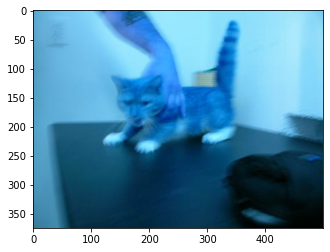

In [24]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
# np.load('/content/my_dataset/Petimages/Cat/'+'0.jpg')
img = cv2.imread('/content/my_dataset/PetImages/Cat/'+'0.jpg')
plt.imshow(img)
# cv2.size(img)


In [35]:
img = cv2.imread('/content/my_dataset/PetImages/Cat/'+'789.jpg', cv2.COLOR_BGR2RGB)
# img = cv2.resize(img,(100,100),interpolation = cv2.INTER_AREA)
# plt.imshow(img)
if img is None:
  print('hola')
print(img)


[[[ 90  86  67]
  [ 83  79  60]
  [ 84  80  61]
  ...
  [ 72  75  73]
  [ 71  74  72]
  [ 70  73  71]]

 [[ 83  79  60]
  [ 83  79  60]
  [ 89  85  66]
  ...
  [ 72  75  73]
  [ 71  74  72]
  [ 71  74  72]]

 [[ 82  78  59]
  [ 89  85  66]
  [ 98  94  75]
  ...
  [ 72  75  73]
  [ 72  75  73]
  [ 71  74  72]]

 ...

 [[138 153 169]
  [142 157 173]
  [132 147 163]
  ...
  [145 169 193]
  [130 154 178]
  [132 156 180]]

 [[132 147 163]
  [137 152 168]
  [136 151 167]
  ...
  [151 175 199]
  [139 163 187]
  [146 170 194]]

 [[137 152 168]
  [140 155 171]
  [142 157 173]
  ...
  [147 171 195]
  [137 161 185]
  [148 172 196]]]


12476


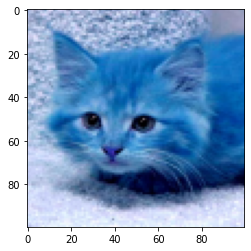

In [50]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np

l = os.listdir('my_dataset/PetImages/Cat')
l=np.array(l)
train=[]
for i in l:
  # print(i)
  img = cv2.imread('/content/my_dataset/PetImages/Cat/'+i, cv2.COLOR_BGR2RGB)
  if img is not None:
    img = cv2.resize(img,(100,100),interpolation = cv2.INTER_AREA)
    train.append([img,0])
plt.imshow(train[0][0])  # train.append(img)
print(len(train))

12476


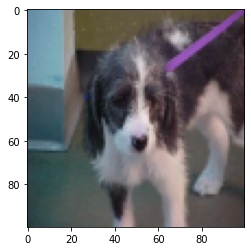

In [46]:
l = os.listdir('my_dataset/PetImages/Dog')
l=np.array(l)
train2=[]
for i in l:
  img = cv2.imread('/content/my_dataset/PetImages/Dog/'+ i, cv2.COLOR_BGR2RGB)
  if img is not None:
    img = cv2.resize(img,(100,100),interpolation = cv2.INTER_AREA)
    train2.append([img,1])
train2.append(train2[0])
train2.append(train2[0])
train2.append(train2[0])
train2.append(train2[0])
train2.append(train2[0])
train2.append(train2[0])
plt.imshow(train2[10000][0])  # train.append(img)
print(len(train2))

In [51]:
for i in train2:
  train.append(i)
print(len(train))  

24952


2
(100, 100, 1)


error: ignored

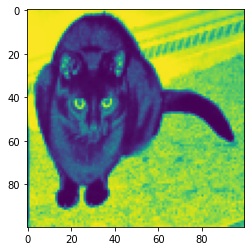

In [73]:

imagen,etiqueta = train[1817]
print(len(imagen.shape))

plt.imshow(imagen)
imagen= expand_dims(imagen,axis=2)
print(imagen.shape)
imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)


In [76]:
import numpy as np
from tensorflow.keras.backend import expand_dims
datos_entrenamiento=[]
tamano_img=100
for i,(imagen,etiqueta) in enumerate(train):
  # print(i)
  # imagen = cv2.resize(imagen,(100,100),interpolation = cv2.INTER_AREA)
  if len(imagen.shape)>2:
    imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
    imagen = imagen.reshape(tamano_img,tamano_img,1)
    datos_entrenamiento.append([imagen,etiqueta])
  else:  
    imagen= expand_dims(imagen,axis=2)
    datos_entrenamiento.append([imagen,etiqueta])


In [77]:
datos_entrenamiento=np.array(datos_entrenamiento)
print(datos_entrenamiento.shape)


(24952, 2)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  """Entry point for launching an IPython kernel.


In [78]:
# plt.imshow(datos_entrenamiento[0][1].reshape(100,100))

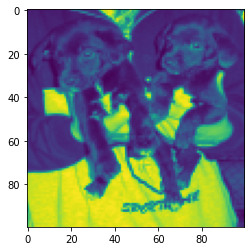

In [88]:
from sklearn.utils import shuffle
datos_entrenamiento = shuffle(datos_entrenamiento, random_state=0)
plt.imshow(datos_entrenamiento[6][0].reshape(100,100))

In [89]:
print(datos_entrenamiento.shape)

(24952, 2)


In [90]:
X=[]
y=[]
for img, etiqueta in datos_entrenamiento:
  X.append(img)
  y.append(etiqueta)
X=np.array(X)
y=np.array(y)
print(X.shape)

(24952, 100, 100, 1)


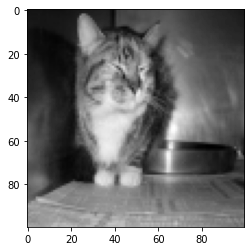

In [93]:

plt.imshow(X[10].reshape(100,100),cmap='gray')

## Guardar

In [94]:
#Guardamos los datos en google drive ya que el proceso de carga es costoso
np.save(BASE_FOLDER + "trainX", X)
np.save(BASE_FOLDER + "trainY", y)


### Cargar

In [95]:
import numpy as np
#Cargamos los datos: my_dataX y my_dataY
X = np.load(BASE_FOLDER + "trainX.npy")
y = np.load(BASE_FOLDER + "trainY.npy")

In [96]:
from tensorflow.keras.layers import Input, Conv2D, Activation, Flatten, Dense, Dropout, BatchNormalization, MaxPooling2D
import tensorflow as tf
modelDenso = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(100, 100, 1)),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid') 
])
modelCNN = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3),activation='relu',input_shape=(100,100,1)),
  tf.keras.layers.MaxPooling2D(2,2),
  tf.keras.layers.Conv2D(64, (3,3),activation='relu'),
  tf.keras.layers.MaxPooling2D(2,2),
  tf.keras.layers.Conv2D(128, (3,3),activation='relu'),
  tf.keras.layers.MaxPooling2D(2,2),
  
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(100, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

modelCNN2 = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3),activation='relu',input_shape=(100,100,1)),
  tf.keras.layers.MaxPooling2D(2,2),
  tf.keras.layers.Conv2D(64, (3,3),activation='relu'),
  tf.keras.layers.MaxPooling2D(2,2),
  tf.keras.layers.Conv2D(128, (3,3),activation='relu'),
  tf.keras.layers.MaxPooling2D(2,2),
  
  tf.keras.layers.Dropout(0.5),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(256, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])


In [97]:
modelDenso.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])
modelCNN.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])
modelCNN2.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])


In [98]:
from tensorflow.keras.callbacks import TensorBoard
tensorboardDenso = TensorBoard(log_dir='logs/denso')
modelDenso.fit(X,y,batch_size=32,
               validation_split=0.15,
               epochs=100,
               callbacks=[tensorboardDenso])

Epoch 1/100
663/663 [==============================] - 6s 4ms/step - loss: 35.6076 - accuracy: 0.5158 - val_loss: 0.7133 - val_accuracy: 0.5057
Epoch 2/100
663/663 [==============================] - 2s 3ms/step - loss: 0.7053 - accuracy: 0.5064 - val_loss: 0.6931 - val_accuracy: 0.4927
Epoch 3/100
663/663 [==============================] - 2s 3ms/step - loss: 0.6935 - accuracy: 0.5032 - val_loss: 0.6930 - val_accuracy: 0.5095
Epoch 4/100
663/663 [==============================] - 2s 3ms/step - loss: 0.6933 - accuracy: 0.4992 - val_loss: 0.6934 - val_accuracy: 0.4913
Epoch 5/100
663/663 [==============================] - 2s 3ms/step - loss: 0.6951 - accuracy: 0.4964 - val_loss: 0.6932 - val_accuracy: 0.4910
Epoch 6/100
663/663 [==============================] - 2s 3ms/step - loss: 0.6932 - accuracy: 0.4981 - val_loss: 0.6930 - val_accuracy: 0.5098
Epoch 7/100
663/663 [==============================] - 2s 4ms/step - loss: 0.6932 - accuracy: 0.4983 - val_loss: 0.6933 - val_accuracy: 0.490

In [99]:
%load_ext tensorboard

In [100]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [101]:
from tensorflow.keras.callbacks import TensorBoard
tensorboardCNN = TensorBoard(log_dir='logs/cnn')
modelCNN.fit(X,y,batch_size=32,
               validation_split=0.15,
               epochs=100,
               callbacks=[tensorboardCNN])

Epoch 1/100
663/663 [==============================] - 15s 10ms/step - loss: 1.0735 - accuracy: 0.5495 - val_loss: 0.6815 - val_accuracy: 0.5442
Epoch 2/100
663/663 [==============================] - 6s 9ms/step - loss: 0.6687 - accuracy: 0.5826 - val_loss: 0.6597 - val_accuracy: 0.6091
Epoch 3/100
663/663 [==============================] - 6s 9ms/step - loss: 0.6230 - accuracy: 0.6519 - val_loss: 0.6162 - val_accuracy: 0.6612
Epoch 4/100
663/663 [==============================] - 6s 9ms/step - loss: 0.5566 - accuracy: 0.7150 - val_loss: 0.5693 - val_accuracy: 0.7029
Epoch 5/100
663/663 [==============================] - 6s 9ms/step - loss: 0.4982 - accuracy: 0.7599 - val_loss: 0.5033 - val_accuracy: 0.7515
Epoch 6/100
663/663 [==============================] - 6s 9ms/step - loss: 0.4152 - accuracy: 0.8084 - val_loss: 0.4794 - val_accuracy: 0.7745
Epoch 7/100
663/663 [==============================] - 6s 9ms/step - loss: 0.3462 - accuracy: 0.8466 - val_loss: 0.4784 - val_accuracy: 0.79

In [ ]:
from tensorflow.keras.callbacks import TensorBoard
tensorboardCNN2 = TensorBoard(log_dir='logs/cnn2')
modelCNN2.fit(X,y,batch_size=32,
               validation_split=0.15,
               epochs=100,
               callbacks=[tensorboardCNN2])

Epoch 1/100
663/663 [==============================] - 7s 9ms/step - loss: 0.9045 - accuracy: 0.5461 - val_loss: 0.6483 - val_accuracy: 0.6270
Epoch 2/100
663/663 [==============================] - 6s 9ms/step - loss: 0.6340 - accuracy: 0.6414 - val_loss: 0.5774 - val_accuracy: 0.6866
Epoch 3/100
663/663 [==============================] - 6s 9ms/step - loss: 0.5488 - accuracy: 0.7220 - val_loss: 0.5001 - val_accuracy: 0.7641
Epoch 4/100
663/663 [==============================] - 6s 9ms/step - loss: 0.4767 - accuracy: 0.7719 - val_loss: 0.4432 - val_accuracy: 0.7887
Epoch 5/100
663/663 [==============================] - 6s 9ms/step - loss: 0.4369 - accuracy: 0.7990 - val_loss: 0.4086 - val_accuracy: 0.8114
Epoch 6/100
663/663 [==============================] - 6s 9ms/step - loss: 0.3898 - accuracy: 0.8245 - val_loss: 0.3996 - val_accuracy: 0.8175
Epoch 7/100
663/663 [==============================] - 6s 9ms/step - loss: 0.3457 - accuracy: 0.8484 - val_loss: 0.3791 - val_accuracy: 0.8258

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds
# Descargar el set de datos
datos, metadatos = tfds.load(kagglecatsanddogs_5340.zip, as_supervised=True, with_info=True)


NameError: ignored

In [ ]:
 metadatos

tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    version=4.0.0,
    description='A large set of images of cats and dogs.There are 1738 corrupted images that are dropped.',
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'image/filename': Text(shape=(), dtype=tf.string),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=2),
    }),
    total_num_examples=23262,
    splits={
        'train': 23262,
    },
    supervised_keys=('image', 'label'),
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, John (JD) and Howell, Jon and Saul, Jared},
    title = {Asirra: A CAPTCHA that Exploits Interest-Aligned Manual Image Categorization},
    booktitle = {Proceedings of 14th ACM Conference on Computer and Communications Security (CCS)},
    ye

,image,label
0,,1 (dog)
1,,1 (dog)
2,,1 (dog)
3,,0 (cat)
4,,1 (dog)

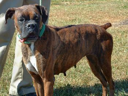
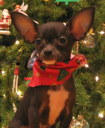
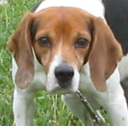
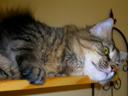
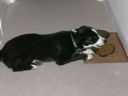

In [ ]:
tfds.as_dataframe(datos['train'].take(5), metadatos)

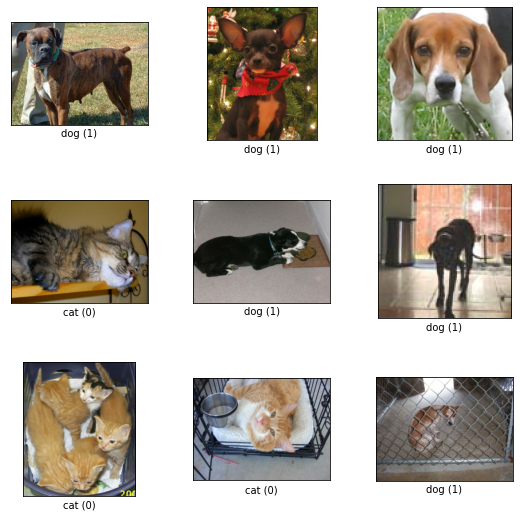

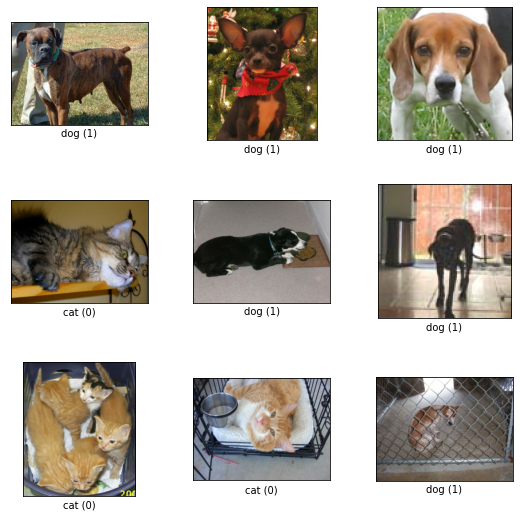

In [ ]:
tfds.show_examples(datos['train'],metadatos)

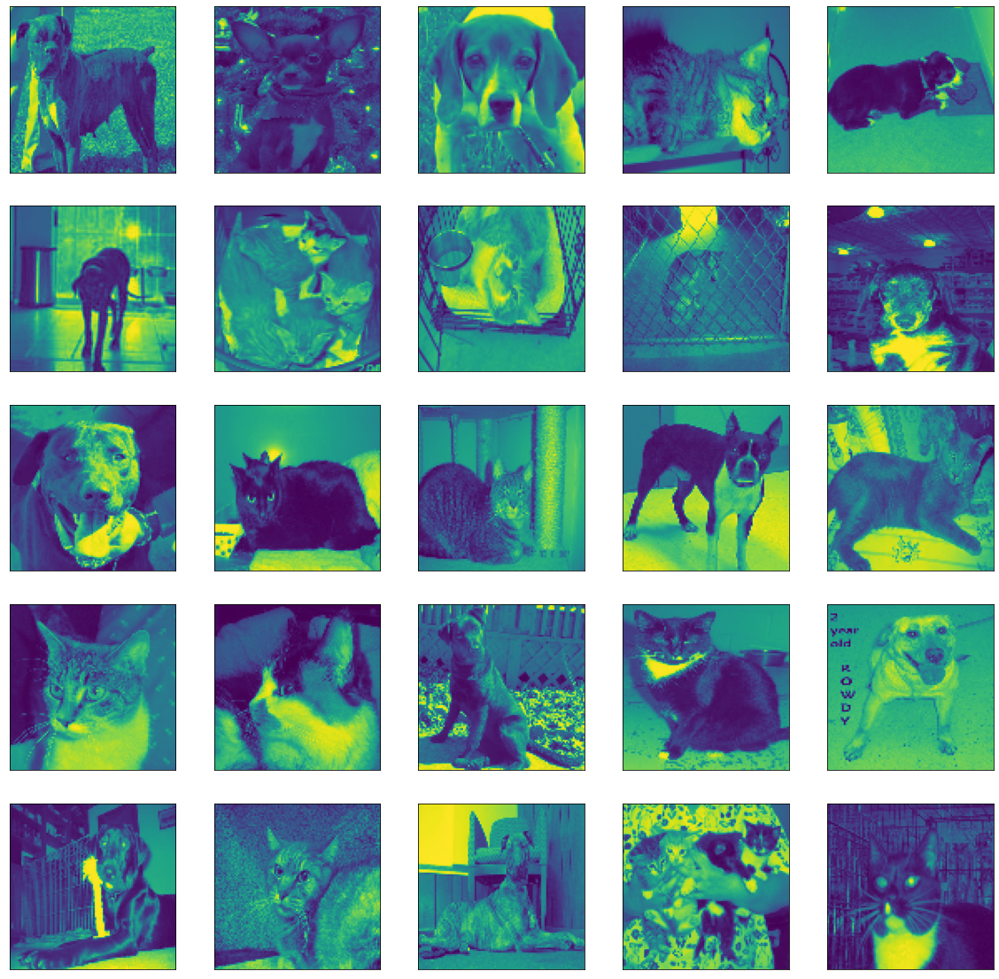

In [ ]:
import matplotlib.pyplot as plt
import cv2
plt.figure(figsize=(20,20))

TAMANO_IMG=100
for i,(imagen,etiqueta) in enumerate(datos['train'].take(25)):
  imagen = cv2.resize(imagen.numpy(),(TAMANO_IMG,TAMANO_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  plt.subplot(5,5,i+1)
  plt.xticks([])
  plt.yticks([])
  pl
  
